In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib as mpl
import IPython.display as display

import PIL.Image
import functools
import time

from numpy.random import seed
seed(111)

mpl.rcParams['figure.figsize'] = (15,15)
mpl.rcParams['axes.grid'] = False

In [2]:
def to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [3]:
content_path = 'columbia.jpg'
style_path = 'van_Gogh.jpg'
content_path2 = 'Manhattan.jpg'
style_path2 = 'Pablo_Picasso.jpg'

In [4]:
def load_img(path):

  img = tf.io.read_file(path)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  l = max(shape)
  scale = 512 / l

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [5]:
def show_image(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

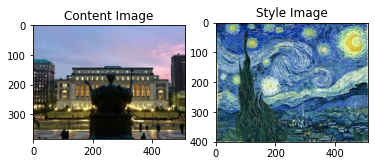

In [13]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
show_image(content_image, 'Content Image')

plt.subplot(1, 2, 2)
show_image(style_image, 'Style Image')

# Output of Different Layers

# Basic Style Transfer

In [ ]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
# pred_prob = vgg(x)
# prediction_probabilities.shape

In [ ]:
# predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(pred_prob.numpy())[0]
# [(class_name, prob) for (number, class_name, prob) in predicted_top_5]

In [7]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)

80142336/80134624 [==============================] - 1s 0us/step

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [8]:
# the layers to extract the content
content_layers = ['block5_conv2'] 

# the layers to extract the style
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [9]:
def vgg_layers(layers):
  # load the pre-trained vgg 
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  output = [vgg.get_layer(name).output for name in layers]

  model = tf.keras.Model([vgg.input], output)
  return model

In [14]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)
'''
#查看每层输出的统计信息
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()
'''

'\n#查看每层输出的统计信息\nfor name, output in zip(style_layers, style_outputs):\n  print(name)\n  print("  shape: ", output.numpy().shape)\n  print("  min: ", output.numpy().min())\n  print("  max: ", output.numpy().max())\n  print("  mean: ", output.numpy().mean())\n  print()\n'

In [15]:
def gram_matrix(x):
  shape = tf.shape(x)
  out1 = tf.linalg.einsum('bijc,bijd->bcd', x, x)
  z = tf.cast(shape[1]*shape[2], tf.float32)
  return out1/z

In [16]:
class NeuralTransfer(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(NeuralTransfer, self).__init__()
    self.vgg =  vgg_layers(style_layers + content_layers)
    self.vgg.trainable = False
    self.content_layers = content_layers
    self.style_layers = style_layers
    self.num_style_layers = len(style_layers)

  def call(self, img):
    "Expects float input in [0,1]"
    img = img*255.0
    img_pre = tf.keras.applications.vgg19.preprocess_input(img)
    img1 = self.vgg(img_pre)

    style = img1[:self.num_style_layers]
    style = [gram_matrix(s) for s in style]

    style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style_layers, style)}

    content = img1[self.num_style_layers:]

    content_dict = {content_name:value 
                    for content_name, value 
                    in zip(self.content_layers, content)}


    return {'style':style_dict,'content':content_dict}

In [17]:
extractor = NeuralTransfer(style_layers, content_layers)

results = extractor(tf.constant(content_image))

style_results = results['style']
'''
print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
'''

'\nprint(\'Styles:\')\nfor name, output in sorted(results[\'style\'].items()):\n  print("  ", name)\n  print("    shape: ", output.numpy().shape)\n  print("    min: ", output.numpy().min())\n  print("    max: ", output.numpy().max())\n  print("    mean: ", output.numpy().mean())\n  print()\n\nprint("Contents:")\nfor name, output in sorted(results[\'content\'].items()):\n  print("  ", name)\n  print("    shape: ", output.numpy().shape)\n  print("    min: ", output.numpy().min())\n  print("    max: ", output.numpy().max())\n  print("    mean: ", output.numpy().mean())\n'

In [18]:
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

In [19]:
image = tf.Variable(content_image)

In [20]:
def image_clip(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [21]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [17]:
style_weight=1
content_weight=1e-3

In [18]:
def compute_loss(x):
    style = x['style']
    style_loss = tf.add_n([tf.reduce_mean((style[i]-style_y[i])**2) 
                           for i in style.keys()])
    style_loss *= style_weight/num_style_layers
    
    content = x['content']
    content_loss = tf.add_n([tf.reduce_mean((content[i]-content_y[i])**2) 
                             for i in content.keys()])
    content_loss *= content_weight / num_content_layers

    loss = style_loss + content_loss
    return loss

In [20]:
@tf.function()
def train_iter(image):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss(x)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

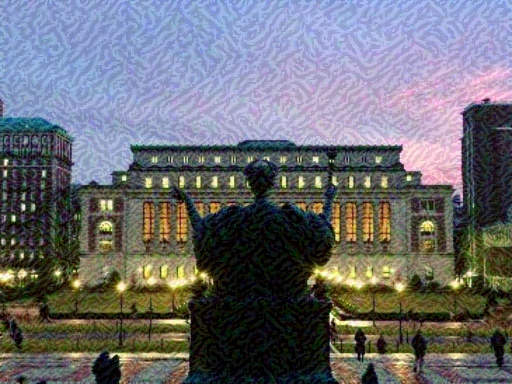

In [ ]:
train_iter(image)
train_iter(image)
train_iter(image)
to_image(image)

In [ ]:
import time
import os
start = time.time()

epochs = 10
iter_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(iter_per_epoch):
    step += 1
    train_iter(image)
    print(".", end='')
  save_path = os.path.join("img_%s.png"%(step))
  display.display(to_image(image),save_path)
  to_image(image).save(save_path)
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

Output hidden; open in https://colab.research.google.com to view.

## Experiments

In [19]:
import time
import os

### Content 1 x Style 1

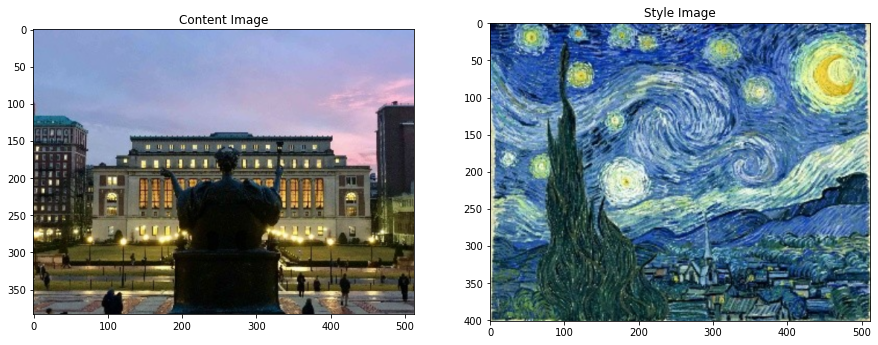

In [31]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
show_image(content_image, 'Content Image')

plt.subplot(1, 2, 2)
show_image(style_image, 'Style Image')

In [32]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)
results = extractor(tf.constant(content_image))
style_results = results['style']
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

image_prepared = tf.Variable(content_image)

In [33]:
opt = tf.optimizers.Adam(learning_rate=0.03, beta_1=0.99, epsilon=1e-1)
@tf.function()
def train_iter(image):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss(x)

  style_weight=1
  content_weight=1e-3  
  grad = tape.gradient(loss, image)
  
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

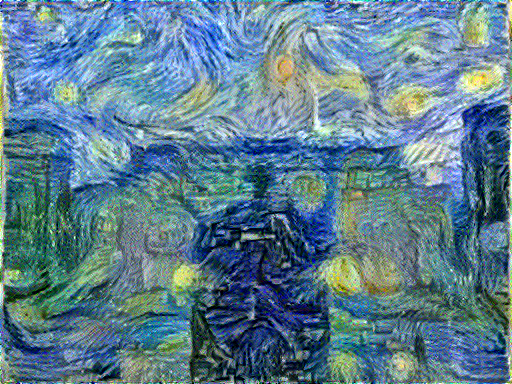

'img_c1_s1.jpg'

Total time: 64.3


In [34]:
start = time.time()
epochs = 1000
image_prepared = basic_style_transfer_prepare(content_path, style_path)
save_path = 'img_c1_s1.jpg'
for n in range(epochs):
  train_iter(image_prepared)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

### Content 1 x Style 2

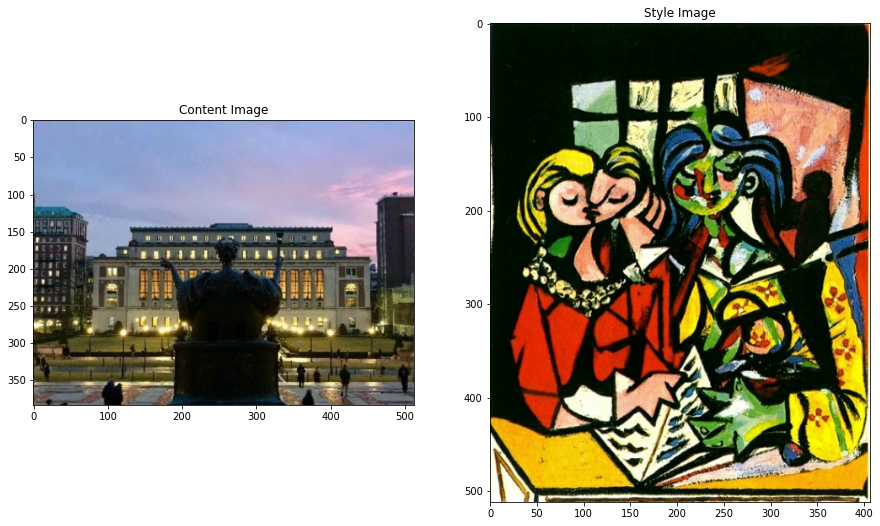

In [51]:
content_image = load_img(content_path)
style_image = load_img(style_path2)

plt.subplot(1, 2, 1)
show_image(content_image, 'Content Image')

plt.subplot(1, 2, 2)
show_image(style_image, 'Style Image')

In [52]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)
results = extractor(tf.constant(content_image))
style_results = results['style']
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

image_prepared = tf.Variable(content_image)

In [53]:
opt = tf.optimizers.Adam(learning_rate=0.03, beta_1=0.99, epsilon=1e-1)
@tf.function()
def train_iter(image):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss(x)

  style_weight=1
  content_weight=1e-3  
  grad = tape.gradient(loss, image)
  
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

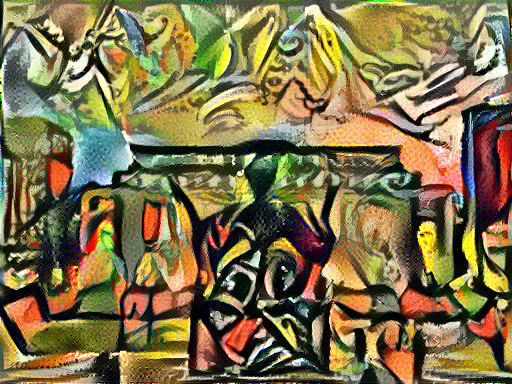

'img_c1_s2.jpg'

Total time: 63.2


In [54]:
start = time.time()
epochs = 1000
#image_prepared = basic_style_transfer_prepare(content_path, style_path)
save_path = 'img_c1_s2.jpg'
for n in range(epochs):
  train_iter(image_prepared)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

### Content 2 x Style 1

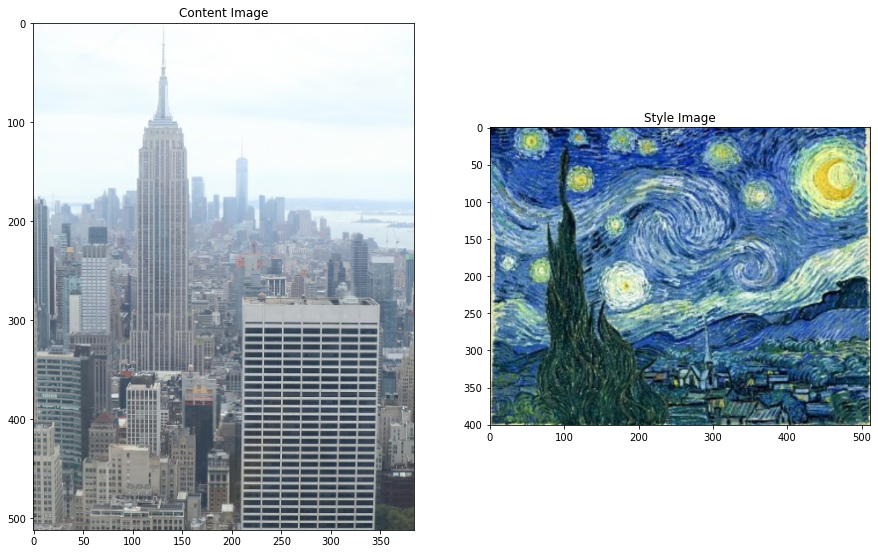

In [55]:
content_image = load_img(content_path2)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
show_image(content_image, 'Content Image')

plt.subplot(1, 2, 2)
show_image(style_image, 'Style Image')

In [56]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)
results = extractor(tf.constant(content_image))
style_results = results['style']
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

image_prepared = tf.Variable(content_image)

In [57]:
opt = tf.optimizers.Adam(learning_rate=0.03, beta_1=0.99, epsilon=1e-1)
@tf.function()
def train_iter(image):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss(x)

  style_weight=1
  content_weight=1e-3  
  grad = tape.gradient(loss, image)
  
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

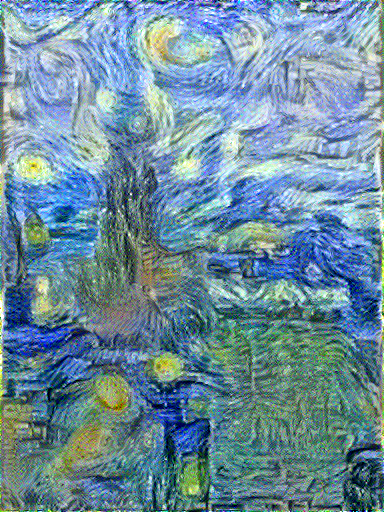

'img_c2_s1.jpg'

Total time: 66.7


In [58]:
start = time.time()
epochs = 1000
#image_prepared = basic_style_transfer_prepare(content_path, style_path)
save_path = 'img_c2_s1.jpg'
for n in range(epochs):
  train_iter(image_prepared)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

### Content 2 x Style 2

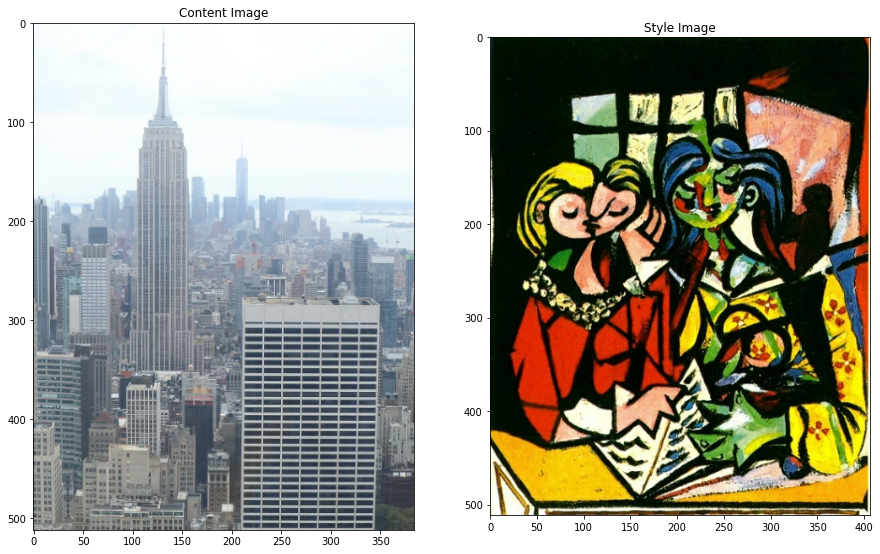

In [59]:
content_image = load_img(content_path2)
style_image = load_img(style_path2)

plt.subplot(1, 2, 1)
show_image(content_image, 'Content Image')

plt.subplot(1, 2, 2)
show_image(style_image, 'Style Image')

In [60]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)
results = extractor(tf.constant(content_image))
style_results = results['style']
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

image_prepared = tf.Variable(content_image)

In [61]:
opt = tf.optimizers.Adam(learning_rate=0.03, beta_1=0.99, epsilon=1e-1)
@tf.function()
def train_iter(image):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss(x)

  style_weight=1
  content_weight=1e-3  
  grad = tape.gradient(loss, image)
  
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

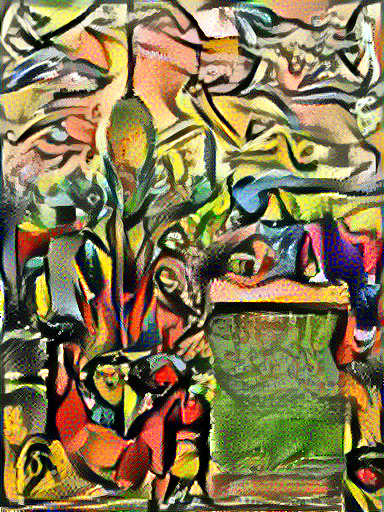

'img_c2_s2.jpg'

Total time: 67.3


In [62]:
start = time.time()
epochs = 1000
save_path = 'img_c2_s2.jpg'
for n in range(epochs):
  train_iter(image_prepared)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

# Tuning models

## Number of Iterations

Iterations = [10, 50, 100, 500, 1000, 5000, 10000,12000,14000,15000]

..........

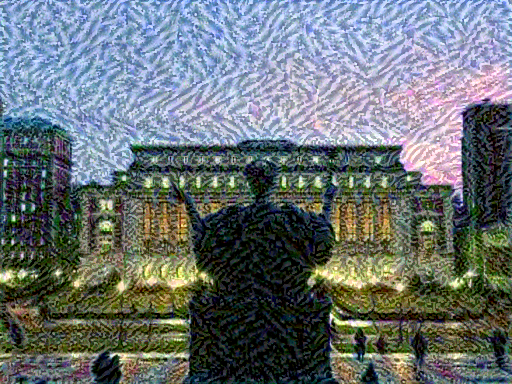

'img_10.png'

train step: 10
current time: 1.9
........................................

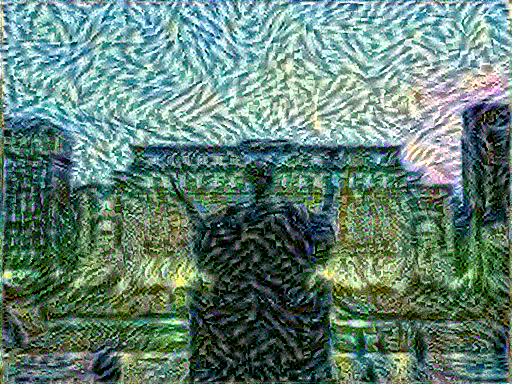

'img_50.png'

train step: 50
current time: 6.8
..................................................

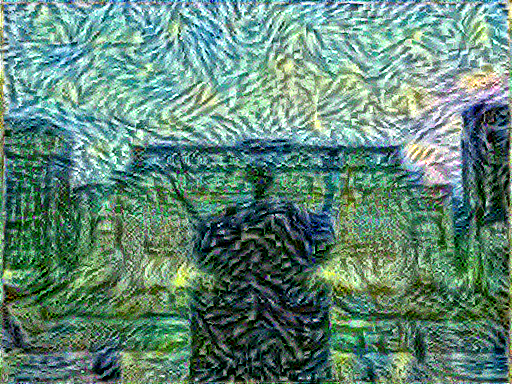

'img_100.png'

train step: 100
current time: 12.9
................................................................................................................................................................................................................................................................................................................................................................................................................

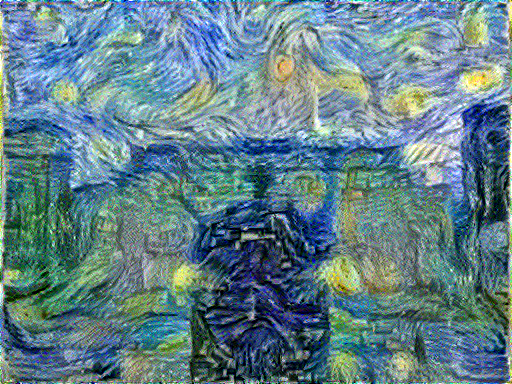

'img_500.png'

train step: 500
current time: 62.6
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

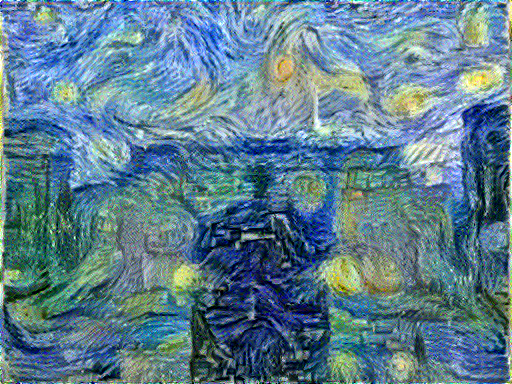

'img_1000.png'

train step: 1000
current time: 128.1
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

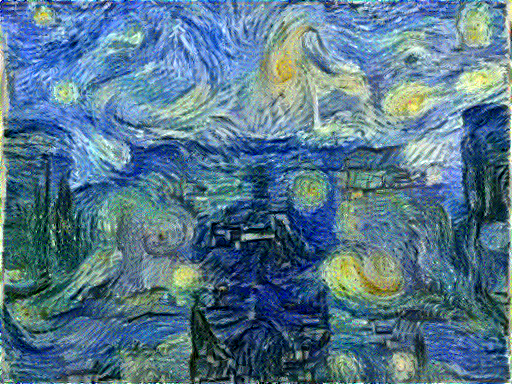

'img_5000.png'

train step: 5000
current time: 647.9
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

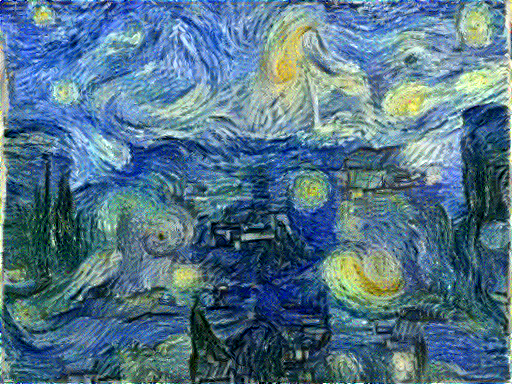

'img_10000.png'

train step: 10000
current time: 1298.3
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

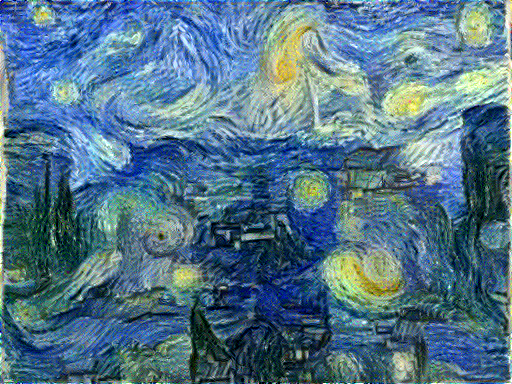

'img_12000.png'

train step: 12000
current time: 1558.6
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

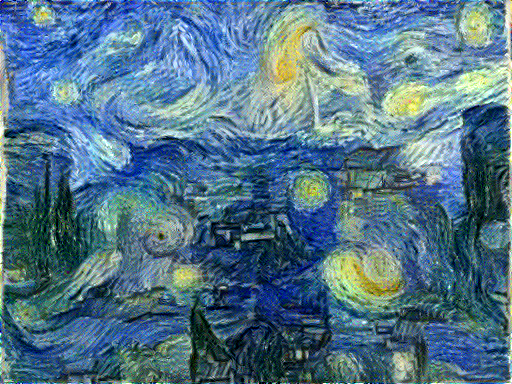

'img_14000.png'

train step: 14000
current time: 1818.7
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

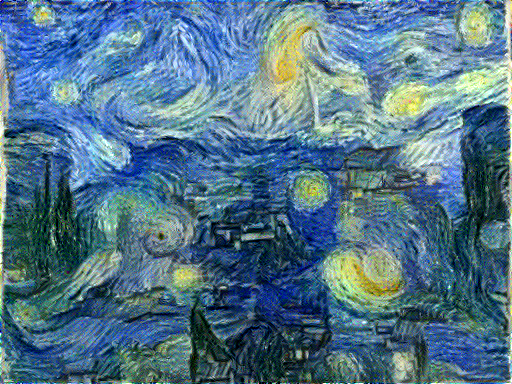

'img_15000.png'

train step: 15000
current time: 1948.5
Total time: 1948.5


In [ ]:
import time
import os
start = time.time()


step = 0
for i in range(15000):
  step += 1
  train_iter(image)
  print(".", end='')
  if step in [10, 50, 100, 500, 1000, 5000, 10000,12000,14000,15000]:
    save_path = os.path.join("img_%s.png"%(step))
    display.display(to_image(image),save_path)
    to_image(image).save(save_path)
    print("train step: {}".format(step))
    end = time.time()
    print("current time: {:.1f}".format(end-start))

end = time.time()
print("Total time: {:.1f}".format(end-start))

## Learning Rate

## Layers

### Change content layer from conv4-2 to conv5-2

In [ ]:
# the layers to extract the content
content_layers = ['block5_conv2'] 

# the layers to extract the style
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
extractor = NeuralTransfer(style_layers, content_layers)

In [ ]:
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

In [ ]:
image = tf.Variable(content_image)

In [ ]:
@tf.function()
def train_iter(image):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss(x)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

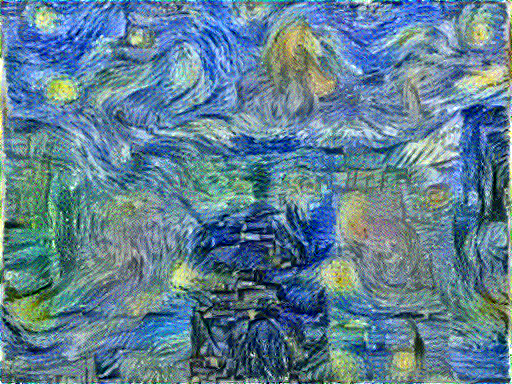

'img_1000.png'

Train step: 1000
Total time: 72.5


In [ ]:
opt = tf.optimizers.Adam(learning_rate=0.05, beta_1=0.99, epsilon=1e-1)


start = time.time()

epochs = 5
iter_per_epoch = 200

step = 0
for n in range(epochs):
  for m in range(iter_per_epoch):
    step += 1
    train_iter(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(to_image(image),save_path)
  print("Train step: {}".format(step))

save_path = os.path.join("img_%s_cont5-2.png"%(step))
to_image(image).save(save_path)
end = time.time()
print("Total time: {:.1f}".format(end-start))

### Change style layer set (change the first one from conv1-1 to conv1-2)

In [ ]:
# the layers to extract the content
content_layers = ['block4_conv2'] 

# the layers to extract the style
style_layers = ['block1_conv2',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
extractor = NeuralTransfer(style_layers, content_layers)

In [ ]:
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

In [ ]:
image = tf.Variable(content_image)

In [ ]:
@tf.function()
def train_iter(image):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss(x)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

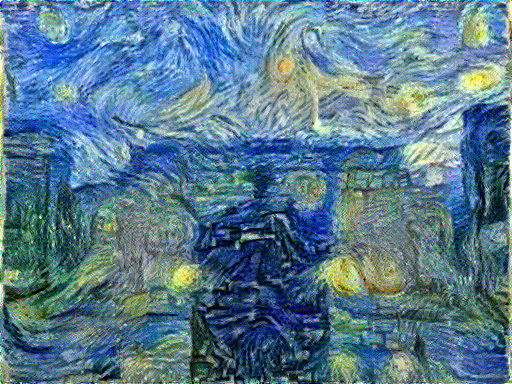

'img_1000_cont5-2.png'

Train step: 1000
Total time: 71.9


In [ ]:
opt = tf.optimizers.Adam(learning_rate=0.03, beta_1=0.99, epsilon=1e-1)


start = time.time()

epochs = 5
iter_per_epoch = 200

step = 0
for n in range(epochs):
  for m in range(iter_per_epoch):
    step += 1
    train_iter(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(to_image(image),save_path)
  print("Train step: {}".format(step))

save_path = os.path.join("img_%s_sty1-2.png"%(step))
to_image(image).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start))

## Optimizer

## Weights

In [6]:
content_path = 'columbia.jpg'
style_path = 'van_Gogh.jpg'
content_path2 = 'Manhattan.jpg'
style_path2 = 'Pablo_Picasso.jpg'

In [23]:
def compute_loss_with_ratio(x, content_weight, style_weight):
    style = x['style']
    style_loss = tf.add_n([tf.reduce_mean((style[i]-style_y[i])**2) 
                           for i in style.keys()])
    style_loss *= style_weight/num_style_layers
    
    content = x['content']
    content_loss = tf.add_n([tf.reduce_mean((content[i]-content_y[i])**2) 
                             for i in content.keys()])
    content_loss *= content_weight / num_content_layers

    loss = style_loss + content_loss
    return loss

In [24]:
@tf.function()
def train_iter_with_ratio(image, content_weight, style_weight):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss_with_ratio(x, content_weight, style_weight)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

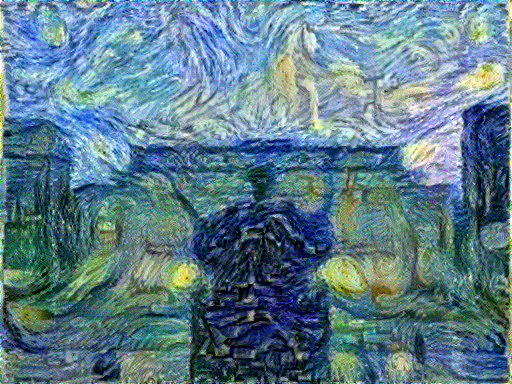

'img_weight_1e-4.jpg'

Total time: 74.8


In [25]:
# alpha: content, beta: style
content_image = load_img(content_path)
image_prepared = tf.Variable(content_image)

content_weight=1e-4
style_weight=1

@tf.function()
def train_iter_with_ratio(image, content_weight, style_weight):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss_with_ratio(x, content_weight, style_weight)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

start = time.time()
epochs = 1000
save_path = 'img_weight_1e-4.jpg'
for n in range(epochs):
  train_iter_with_ratio(image_prepared, content_weight, style_weight)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

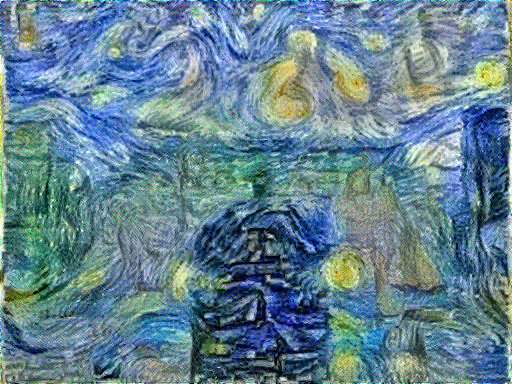

'img_weight_1e-2.jpg'

Total time: 73.7


In [28]:
# alpha: content, beta: style
content_image = load_img(content_path)
image_prepared = tf.Variable(content_image)

content_weight=1e-2
style_weight=1

@tf.function()
def train_iter_with_ratio(image, content_weight, style_weight):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss_with_ratio(x, content_weight, style_weight)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

start = time.time()
epochs = 1000
save_path = 'img_weight_1e-2.jpg'
for n in range(epochs):
  train_iter_with_ratio(image_prepared, content_weight, style_weight)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

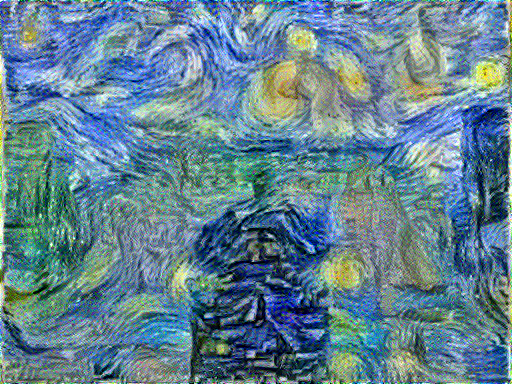

'img_weight_1e+2.jpg'

Total time: 73.0


In [29]:
# alpha: content, beta: style
content_image = load_img(content_path)
image_prepared = tf.Variable(content_image)

content_weight=1e2
style_weight=1

@tf.function()
def train_iter_with_ratio(image, content_weight, style_weight):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss_with_ratio(x, content_weight, style_weight)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

start = time.time()
epochs = 1000
save_path = 'img_weight_1e+2.jpg'
for n in range(epochs):
  train_iter_with_ratio(image_prepared, content_weight, style_weight)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

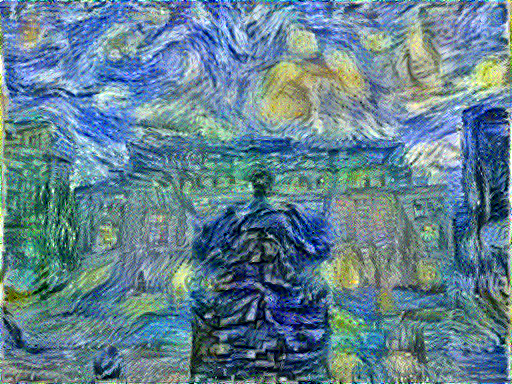

'img_weight_1e+4.jpg'

Total time: 72.8


In [27]:
# alpha: content, beta: style
content_image = load_img(content_path)
image_prepared = tf.Variable(content_image)

content_weight=1e4
style_weight=1

@tf.function()
def train_iter_with_ratio(image, content_weight, style_weight):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss_with_ratio(x, content_weight, style_weight)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

start = time.time()
epochs = 1000
save_path = 'img_weight_1e+4.jpg'
for n in range(epochs):
  train_iter_with_ratio(image_prepared, content_weight, style_weight)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

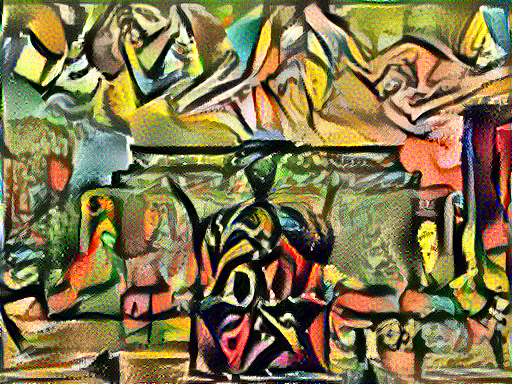

'img_weight2_1e-4.jpg'

Total time: 73.6


In [30]:
# alpha: content, beta: style
# try a different style
content_image = load_img(content_path)
image_prepared = tf.Variable(content_image)
style_image = load_img(style_path2)

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)
results = extractor(tf.constant(content_image))
style_results = results['style']
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

image_prepared = tf.Variable(content_image)

content_weight=1e-4
style_weight=1

@tf.function()
def train_iter_with_ratio(image, content_weight, style_weight):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss_with_ratio(x, content_weight, style_weight)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

start = time.time()
epochs = 1000
save_path = 'img_weight2_1e-4.jpg'
for n in range(epochs):
  train_iter_with_ratio(image_prepared, content_weight, style_weight)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

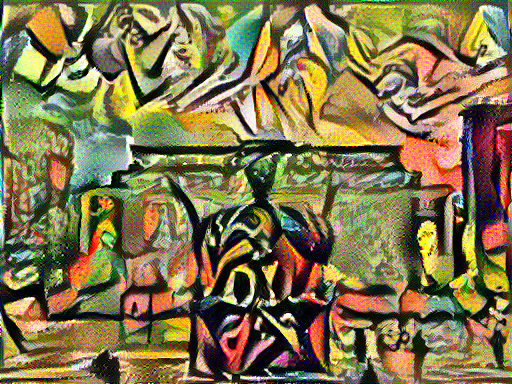

'img_weight2_1e4.jpg'

Total time: 72.9


In [31]:
# alpha: content, beta: style
# try a different style
content_image = load_img(content_path)
image_prepared = tf.Variable(content_image)
style_image = load_img(style_path2)

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)
results = extractor(tf.constant(content_image))
style_results = results['style']
content_y = extractor(content_image)['content']
style_y = extractor(style_image)['style']

image_prepared = tf.Variable(content_image)

content_weight=1e4
style_weight=1

@tf.function()
def train_iter_with_ratio(image, content_weight, style_weight):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss_with_ratio(x, content_weight, style_weight)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

start = time.time()
epochs = 1000
save_path = 'img_weight2_1e4.jpg'
for n in range(epochs):
  train_iter_with_ratio(image_prepared, content_weight, style_weight)

display.display(to_image(image_prepared),save_path)
to_image(image_prepared).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start)) 

## Random Seed

seed = [111,222,333,999]

In [ ]:
random_seed = 111
tf.random.set_seed(random_seed)

In [ ]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [ ]:
def train_iter(image):
  with tf.GradientTape() as tape:
    x = extractor(image)
    loss = compute_loss(x)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(image_clip(image))

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

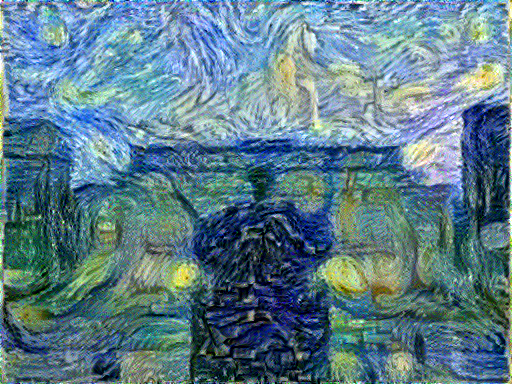

'img_1000_111.png'

train step: 1000
Total time: 130.0


In [ ]:
step = 0
image = tf.Variable(content_image)
start = time.time()
for i in range(1000):
  step += 1
  train_iter(image)
  print(".", end='')
  if step ==1000:
    save_path = os.path.join("img_%s_111.png"%(step))
    display.display(to_image(image),save_path)
    to_image(image).save(save_path)
    print("train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

# Photo + Photo, Drawing + Drawing

# Other Pre-trained Parameters

In [ ]:
def load_img_w2(path):

  img = tf.io.read_file(path)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  new_shape = tf.cast([224,224], tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [ ]:
content_image_w2 = load_img_w2(content_path)
style_image_w2 = load_img_w2(style_path)

In [ ]:
# the layers to extract the content
content_layers = ['block4_conv2'] 

# the layers to extract the style
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
def vgg_layers_w2(layers):
  # load the pre-trained vgg 
  vgg = tf.keras.applications.VGG19()
  vgg.load_weights("vgg19_weights_tf_dim_ordering_tf_kernels.h5")
  vgg.trainable = False

  output = [vgg.get_layer(name).output for name in layers]

  model = tf.keras.Model([vgg.input], output)
  return model

In [ ]:
style_extractor = vgg_layers_w2(style_layers)
style_outputs = style_extractor(style_image_w2*255)
'''
#查看每层输出的统计信息
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()
'''

'\n#查看每层输出的统计信息\nfor name, output in zip(style_layers, style_outputs):\n  print(name)\n  print("  shape: ", output.numpy().shape)\n  print("  min: ", output.numpy().min())\n  print("  max: ", output.numpy().max())\n  print("  mean: ", output.numpy().mean())\n  print()\n'

In [ ]:
class NeuralTransfer_w2(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(NeuralTransfer_w2, self).__init__()
    self.vgg =  vgg_layers_w2(style_layers + content_layers)
    self.vgg.trainable = False
    self.content_layers = content_layers
    self.style_layers = style_layers
    self.num_style_layers = len(style_layers)

  def call(self, img):
    "Expects float input in [0,1]"
    img = img*255.0
    img_pre = tf.keras.applications.vgg19.preprocess_input(img)
    img1 = self.vgg(img_pre)

    style = img1[:self.num_style_layers]
    style = [gram_matrix(s) for s in style]

    style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style_layers, style)}

    content = img1[self.num_style_layers:]

    content_dict = {content_name:value 
                    for content_name, value 
                    in zip(self.content_layers, content)}


    return {'style':style_dict,'content':content_dict}

In [ ]:
extractor = NeuralTransfer_w2(style_layers,content_layers)

content_y = extractor(content_image_w2)['content']
style_y = extractor(style_image_w2)['style']

In [ ]:
image_w2 = tf.Variable(content_image_w2)

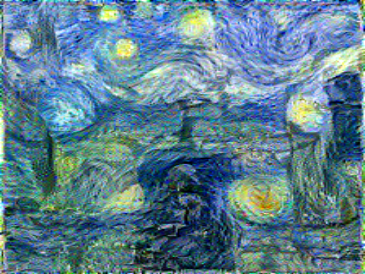

Train step: 1000
Total time: 23.2


In [ ]:
@tf.function()
def train_iter(image_w2):
  with tf.GradientTape() as tape:
    x = extractor(image_w2)
    loss = compute_loss(x)

  grad = tape.gradient(loss, image_w2)
  opt.apply_gradients([(grad, image_w2)])
  image_w2.assign(image_clip(image_w2))

opt = tf.optimizers.Adam(learning_rate=0.03, beta_1=0.99, epsilon=1e-1)

start = time.time()

epochs = 5
iter_per_epoch = 200

step = 0
for n in range(epochs):
  for m in range(iter_per_epoch):
    step += 1
    train_iter(image_w2)
    print(".", end='')
  display.clear_output(wait=True)
  shape_w2 = tf.cast([274, 365], tf.int32)
  img_w2 = tf.image.resize(image_w2,shape_w2)
  display.display(to_image(img_w2))
  print("Train step: {}".format(step))

save_path = os.path.join("img_%s_w2.png"%(step))
to_image(img_w2).save(save_path)

end = time.time()
print("Total time: {:.1f}".format(end-start))